<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/cellAtlasNeuronSearch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Download data from Box

In [1]:
#Kallisto bus clustered starvation data, h5ad
!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w

#Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing (raw)
!wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww

#Previously saved neuron subpopulations
!wget --quiet https://caltech.box.com/shared/static/pxsxk2l24jsmsxx03nkd4isj9a2fk7ek

#Neurons raw, all nonzero genes
!wget --quiet https://caltech.box.com/shared/static/1dq1nzp0t6lyznhl967sjkxaksd29xbf

In [2]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg

!pip install --quiet louvain

     |████████████████████████████████| 122kB 4.2MB/s 
     |████████████████████████████████| 7.7MB 4.6MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 71kB 8.6MB/s 
     |████████████████████████████████| 2.4MB 4.2MB/s 
     |████████████████████████████████| 3.2MB 51.2MB/s 
     |████████████████████████████████| 2.2MB 4.2MB/s 


In [3]:
#Install Packages
import random
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

#import scrublet as scr

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")

Read in + make data for heatmap plotting

In [4]:
#Read in h5ad file
bus_fs = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs)

raw_fs = anndata.read('3l60szs0e9hgaax4q9dbuehgoo092xww')

raw_fs = raw_fs[bus_fs.obs_names,]
#Transfer info from embedded version
raw_fs.obs['cellRanger_louvain'] = pd.Categorical(bus_fs.obs['cellRanger_louvain'])
raw_fs.obs['fed'] = pd.Categorical(bus_fs.obs['fed'])
raw_fs.obsm['X_tsne'] = bus_fs.obsm['X_tsne']

print(raw_fs)

#Previously saved neurons
neurons = anndata.read("pxsxk2l24jsmsxx03nkd4isj9a2fk7ek")

print(neurons)

neurons_raw = anndata.read("1dq1nzp0t6lyznhl967sjkxaksd29xbf")
print(neurons_raw)

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'cellRanger_louvain', 'fed'
    obsm: 'X_tsne'
AnnData object with n_obs × n_vars = 1387 × 2000
    obs: 'batch', 'cellRanger_louvain', 'fed', 'n_counts', 'louvain_neur', 'test_louvain'
    var: 'n_

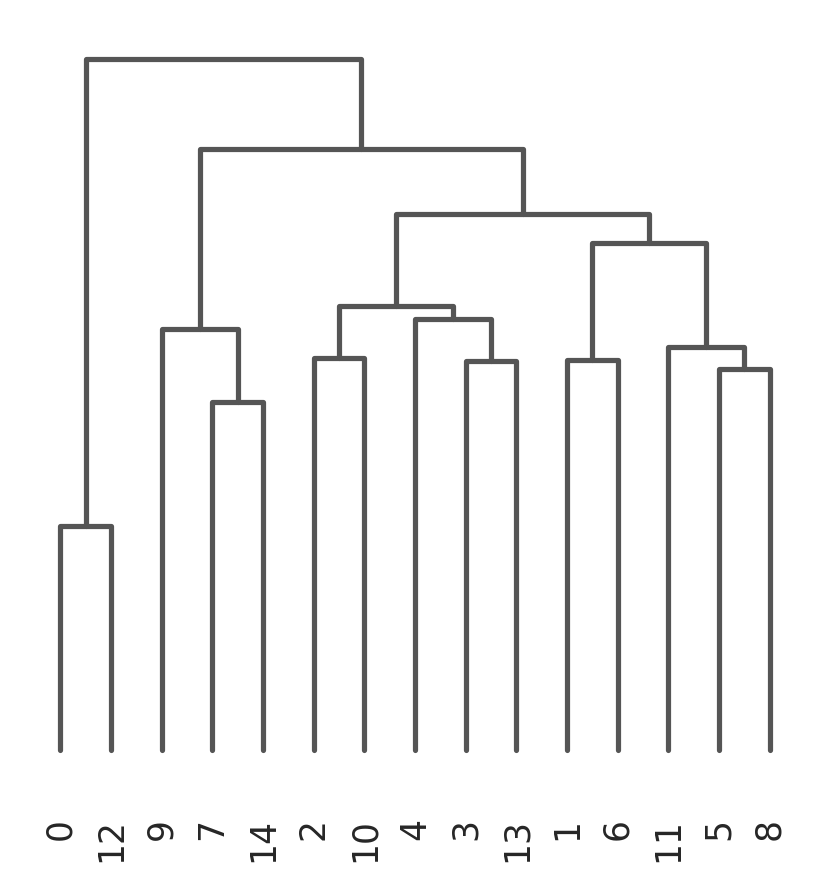

In [ ]:
#Dendrogram for neurons (so heatmap organized by clustering)
sc.tl.dendrogram(neurons,'louvain_neur',linkage_method='ward')
neurons.uns['dendrogram_louvain_neur'] = neurons.uns["dendrogram_['louvain_neur']"]
sc.pl.dendrogram(neurons,'louvain_neur')

In [ ]:
#Make neurons adata with all nonzero expression genes (not just highly variable ones)
sc.pp.filter_cells(neurons_raw, min_counts=0)
sc.pp.filter_genes(neurons_raw, min_counts=0)

sc.pp.normalize_per_cell(neurons_raw, counts_per_cell_after=1e4)

sc.pp.log1p(neurons_raw)

#Transfer necessary labels to adata object
neurons_raw.obs['louvain_neur'] = neurons.obs['louvain_neur']
neurons_raw.obsm['X_tsne'] = neurons.obsm['X_tsne']
neurons_raw.obsm['X_umap'] = neurons.obsm['X_umap']

neurons_raw.uns['dendrogram_louvain_neur'] = neurons.uns['dendrogram_louvain_neur']
neurons_raw.uns['louvain_neur_colors'] = neurons.uns['louvain_neur_colors']

neurons_raw

AnnData object with n_obs × n_vars = 1387 × 46716
    obs: 'batch', 'cellRanger_louvain', 'fed', 'n_counts', 'louvain_neur'
    var: 'n_counts'
    uns: 'log1p', 'dendrogram_louvain_neur', 'louvain_neur_colors'
    obsm: 'X_tsne', 'X_umap'

Set list(s) of genes to plot

In [6]:
#Set list of genes to plot
genes = ['XLOC_014365','XLOC_039658','XLOC_026179','XLOC_037659','XLOC_014942','XLOC_009450','XLOC_037610','XLOC_035947',
 'XLOC_045755','XLOC_043531','XLOC_039390','XLOC_040602','XLOC_034872','XLOC_021040','XLOC_044379',
 'XLOC_003367','XLOC_010274','XLOC_033853','XLOC_036636','XLOC_021850']

#Filter for gene names in annotation
inRaw = [i for i in genes if i in list(neurons_raw.var_names)]
notInRaw = [i for i in genes if i not in list(neurons_raw.var_names)]
print('Missing genes: ',notInRaw)

Missing genes:  []


Plot gene expression across NEURON SUBPOPULATIONS

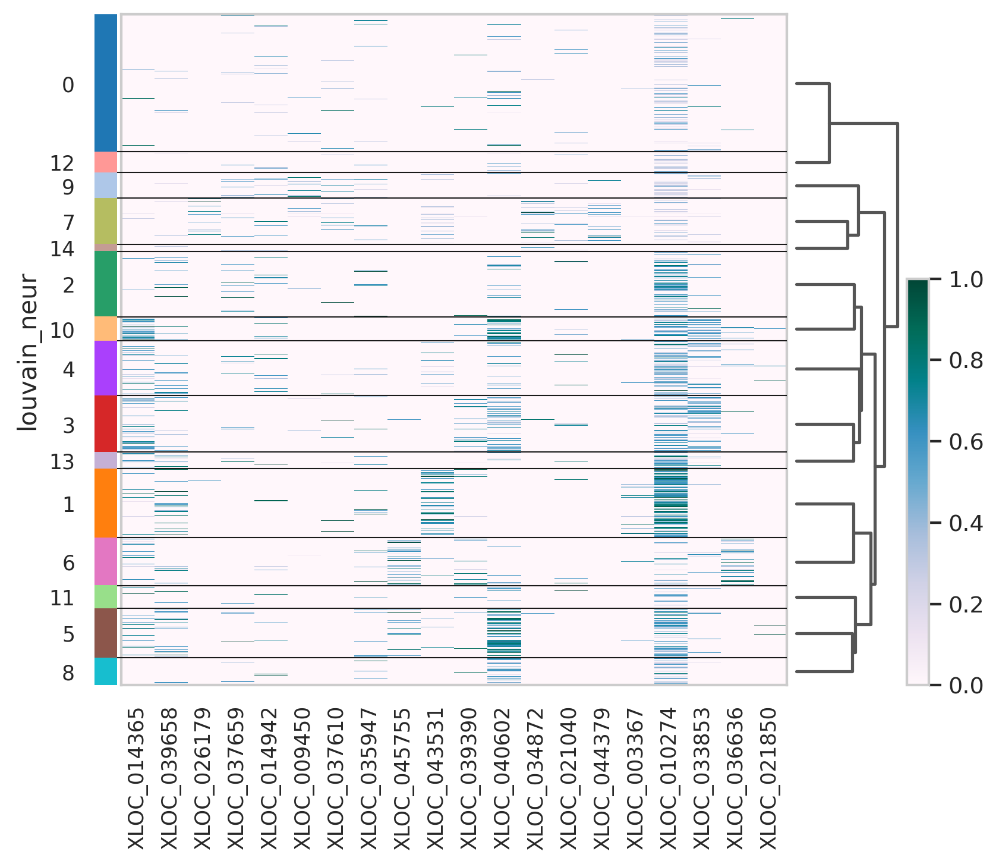

In [ ]:
#Plot heatmap for genes in NEURON SUBPOPULATIONS
toPlot = neurons_raw[:,inRaw]
sc.pl.heatmap(toPlot, inRaw, groupby='louvain_neur', dendrogram=True,show_gene_labels=True,
              cmap='PuBuGn',standard_scale='var')

Plot gene expression across CELL ATLAS

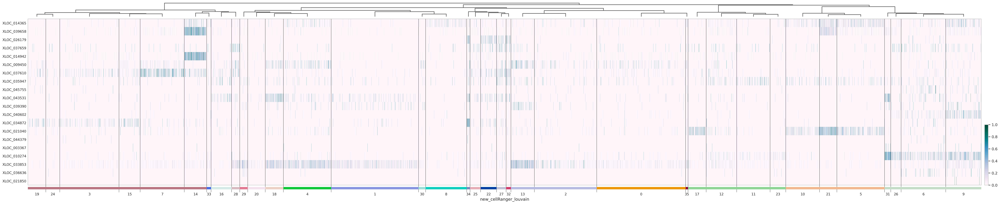

In [7]:
#Plot gene expression in CELL ATLAS

raw_fs.obs['new_cellRanger_louvain'] = bus_fs.obs['new_cellRanger_louvain']
raw_fs.uns["dendrogram_new_cellRanger_louvain"] = bus_fs.uns["dendrogram_new_cellRanger_louvain"]
raw_fs.uns['new_cellRanger_louvain_colors'] = bus_fs.uns['new_cellRanger_louvain_colors']

raw_fs.obsm['X_umap'] = bus_fs.obsm['X_umap']

#Log values in adata
toPlot = raw_fs.copy()
sc.pp.log1p(toPlot)

sc.pl.heatmap(toPlot, inRaw, groupby='new_cellRanger_louvain',dendrogram=True, show_gene_labels=True,swap_axes=True,figsize = (50,10),
              cmap='PuBuGn',standard_scale='var')

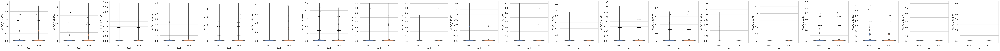

In [8]:
sc.pl.violin(toPlot, keys=inRaw, groupby='fed')

Plot genes on UMAP (2D Embedding)

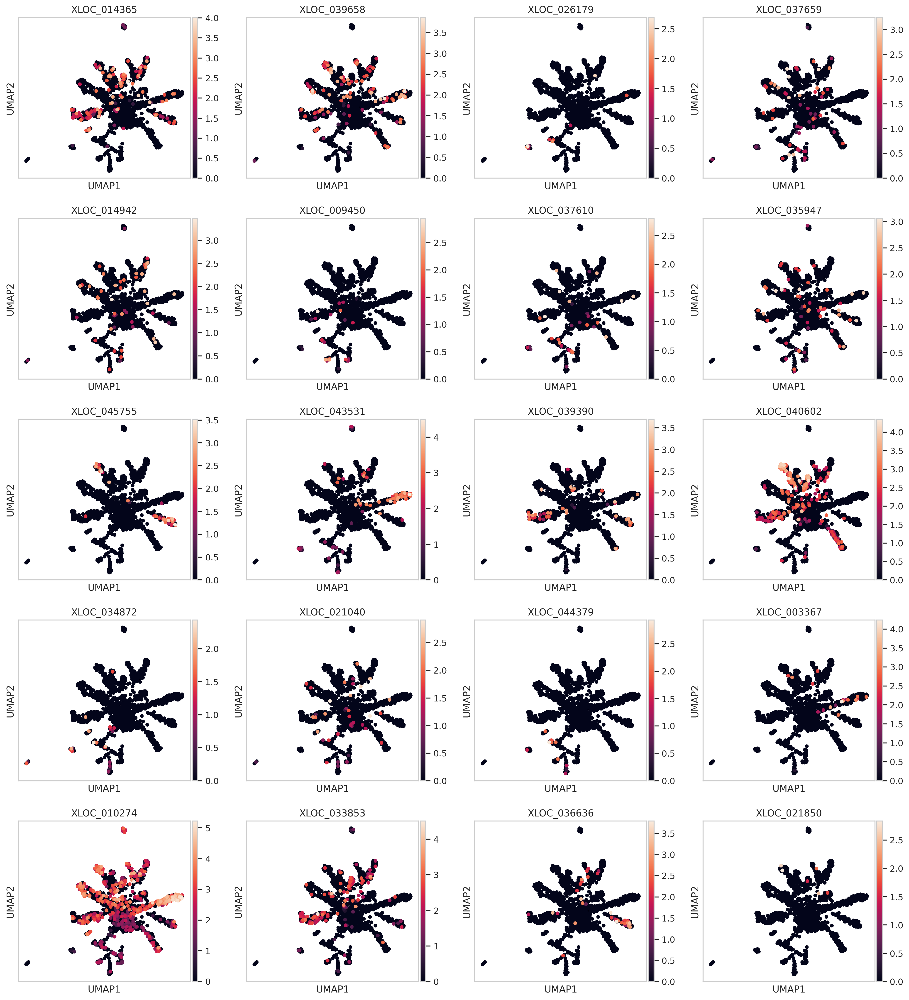

In [ ]:
#Neuron subpopulations
sc.pl.umap(neurons_raw,color=inRaw)

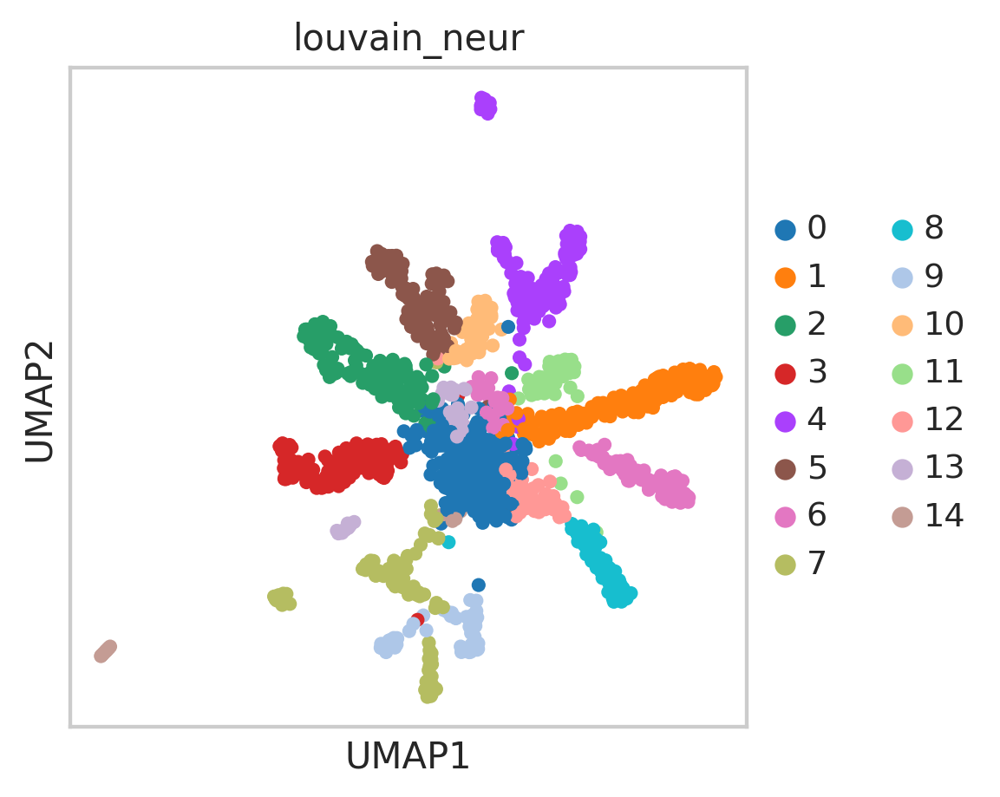

In [ ]:
#See neuron subpopulations
sc.pl.umap(neurons_raw,color=['louvain_neur'])

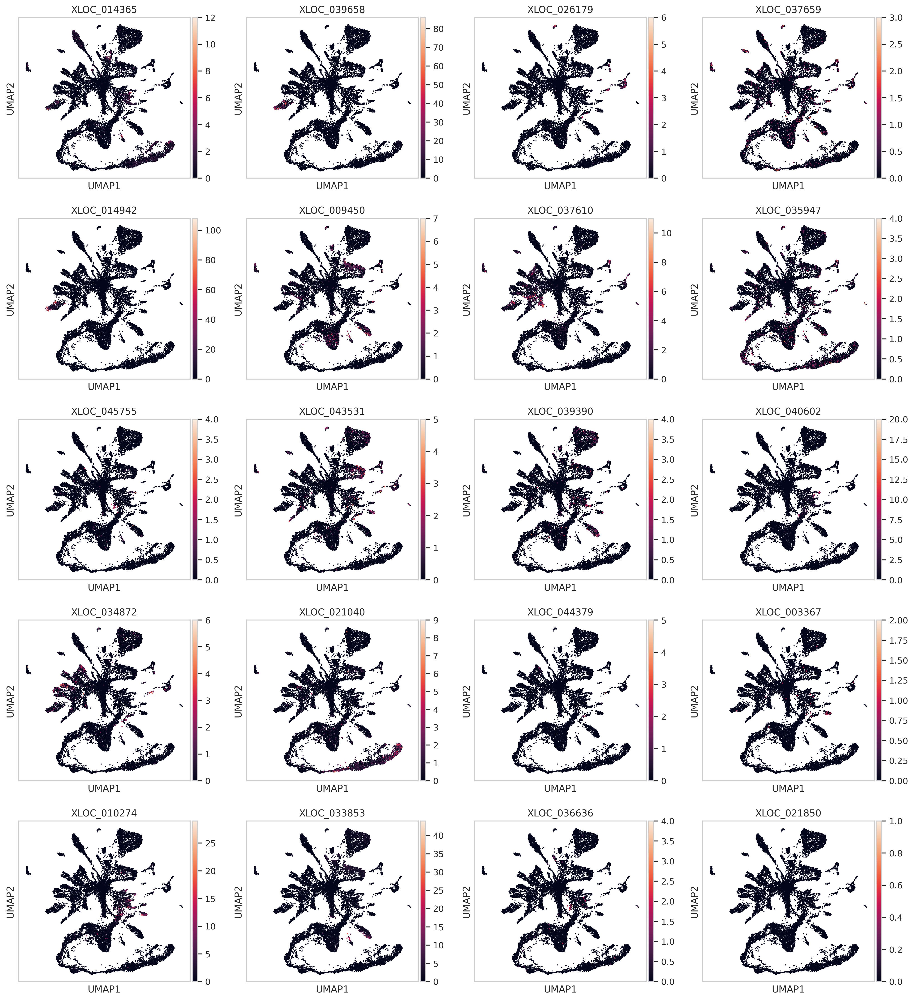

In [ ]:
#Cell Atlas
sc.pl.umap(raw_fs,color=inRaw)

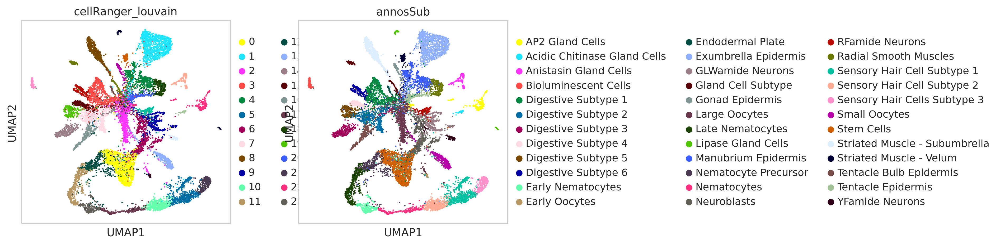

In [ ]:
#See Cell Atlas populations
raw_fs.obs['annosSub'] = bus_fs.obs['annosSub']
sc.pl.umap(raw_fs,color=['cellRanger_louvain','annosSub'])